aaa

In [14]:
from F1Archive.data.qualy_extractor import QualyExtractor
from F1Archive.data.data_extraction import DataExtractor
import pandas as pd

In [221]:
years = [*range(2000, 2008, 1)]
years = list(reversed(years))
years_s = ['{0}'.format(element) for element in years]

In [220]:
DX = DataExtractor()
DX.get_race_urls(1970)
DX.seasons_results(print_dataframes=True)
test_zbior = DX.year_results['1970']

2023-01-24 19:27:46,944 | INFO: Extracting results for 1970 season
2023-01-24 19:27:46,944 | INFO: Extracting results for 1970 season
2023-01-24 19:27:46,955 | INFO: Race: south-africa
2023-01-24 19:27:46,955 | INFO: Race: south-africa
2023-01-24 19:27:49,102 | INFO: Race: spain
2023-01-24 19:27:49,102 | INFO: Race: spain
2023-01-24 19:27:49,937 | INFO: Race: monaco
2023-01-24 19:27:49,937 | INFO: Race: monaco
2023-01-24 19:27:50,852 | INFO: Race: belgium
2023-01-24 19:27:50,852 | INFO: Race: belgium
2023-01-24 19:27:51,633 | INFO: Race: netherlands
2023-01-24 19:27:51,633 | INFO: Race: netherlands
2023-01-24 19:27:52,483 | INFO: Race: france
2023-01-24 19:27:52,483 | INFO: Race: france
2023-01-24 19:27:53,350 | INFO: Race: great-britain
2023-01-24 19:27:53,350 | INFO: Race: great-britain
2023-01-24 19:27:54,418 | INFO: Race: germany
2023-01-24 19:27:54,418 | INFO: Race: germany
2023-01-24 19:27:55,263 | INFO: Race: austria
2023-01-24 19:27:55,263 | INFO: Race: austria
2023-01-24 19:27

                  Driver                   Details          Position        \
                                            Driver  Car south-africa spain   
0          Jack Brabham           Jack Brabham BRA  BRA            1    NC   
1           Denny Hulme            Denny Hulme HUL  MCL            2    NC   
2        Jackie Stewart         Jackie Stewart STE  MAR            3     1   
3  Jean-Pierre Beltoise   Jean-Pierre Beltoise BEL  MAT            4    NC   
4            John Miles             John Miles MIL  LOT            5     0   

                                                   ...  Points              \
  monaco belgium netherlands france great-britain  ... belgium netherlands   
0      2      NC          11      3             2  ...     0.0         0.0   
1      4       0           0      4             3  ...     0.0         0.0   
2     NC      NC           2      9            NC  ...     0.0         6.0   
3     NC       3           5     13            NC  ...     4.0 

In [42]:
df1 = test_zbior[[('Details', 'Driver'), ('Details', 'Car')]]
df1.insert(2, 'Year', '1956')
print(df1.tail())
df1.to_csv('drivers.csv', sep=',', encoding='utf-8',mode = 'a', header=False, index=False)

                     Details       Year
                      Driver  Car      
89            Jean Behra BEH  MAS  1956
90            Jo Bonnier BON  MAS  1956
91    Juan Manuel Fangio FAN  FER  1956
92            Les Leston LES  CON  1956
93  Toulo de Graffenried DEG  MAS  1956


In [62]:
import csv

all_drivers2 = []

with open('drivers.csv', mode='r') as csv_file:
    csv_reader = csv.DictReader(csv_file)
    for row in csv_reader:
        all_drivers2.append((row["Driver"], row["Car"], row["Year"]))

In [63]:
all_drivers2

[('Valtteri Bottas BOT', 'MER', '2019'),
 ('Lewis Hamilton HAM', 'MER', '2019'),
 ('Max Verstappen VER', 'RED', '2019'),
 ('Sebastian Vettel VET', 'FER', '2019'),
 ('Charles Leclerc LEC', 'FER', '2019'),
 ('Kevin Magnussen MAG', 'HAA', '2019'),
 ('Nico Hulkenberg HUL', 'REN', '2019'),
 ('Kimi RĂ¤ikkĂ¶nen RAI', 'ALF', '2019'),
 ('Lance Stroll STR', 'RAC', '2019'),
 ('Daniil Kvyat KVY', 'SCU', '2019'),
 ('Pierre Gasly GAS', 'RED', '2019'),
 ('Lando Norris NOR', 'MCL', '2019'),
 ('Sergio Perez PER', 'RAC', '2019'),
 ('Alexander Albon ALB', 'SCU', '2019'),
 ('Antonio Giovinazzi GIO', 'ALF', '2019'),
 ('George Russell RUS', 'WIL', '2019'),
 ('Robert Kubica KUB', 'WIL', '2019'),
 ('Romain Grosjean GRO', 'HAA', '2019'),
 ('Daniel Ricciardo RIC', 'REN', '2019'),
 ('Carlos Sainz SAI', 'MCL', '2019'),
 ('Sebastian Vettel VET', 'FER', '2018'),
 ('Lewis Hamilton HAM', 'MER', '2018'),
 ('Kimi RĂ¤ikkĂ¶nen RAI', 'FER', '2018'),
 ('Daniel Ricciardo RIC', 'RED', '2018'),
 ('Fernando Alonso ALO', 'MCL',

In [64]:
connections2 = []
    
for i in range(len(all_drivers2)):
    for j in range(len(all_drivers2)):
        if (all_drivers2[i][1] == all_drivers2[j][1]) and (all_drivers2[i][2] == all_drivers2[j][2]) and (all_drivers2[i][0] != all_drivers2[j][0]):
            connections2.append((all_drivers2[i], all_drivers2[j]))

In [65]:
connections2

[(('Valtteri Bottas BOT', 'MER', '2019'),
  ('Lewis Hamilton HAM', 'MER', '2019')),
 (('Lewis Hamilton HAM', 'MER', '2019'),
  ('Valtteri Bottas BOT', 'MER', '2019')),
 (('Max Verstappen VER', 'RED', '2019'), ('Pierre Gasly GAS', 'RED', '2019')),
 (('Sebastian Vettel VET', 'FER', '2019'),
  ('Charles Leclerc LEC', 'FER', '2019')),
 (('Charles Leclerc LEC', 'FER', '2019'),
  ('Sebastian Vettel VET', 'FER', '2019')),
 (('Kevin Magnussen MAG', 'HAA', '2019'),
  ('Romain Grosjean GRO', 'HAA', '2019')),
 (('Nico Hulkenberg HUL', 'REN', '2019'),
  ('Daniel Ricciardo RIC', 'REN', '2019')),
 (('Kimi RĂ¤ikkĂ¶nen RAI', 'ALF', '2019'),
  ('Antonio Giovinazzi GIO', 'ALF', '2019')),
 (('Lance Stroll STR', 'RAC', '2019'), ('Sergio Perez PER', 'RAC', '2019')),
 (('Daniil Kvyat KVY', 'SCU', '2019'), ('Alexander Albon ALB', 'SCU', '2019')),
 (('Pierre Gasly GAS', 'RED', '2019'), ('Max Verstappen VER', 'RED', '2019')),
 (('Lando Norris NOR', 'MCL', '2019'), ('Carlos Sainz SAI', 'MCL', '2019')),
 (('Serg

In [66]:
good_connection = []

for i in range(len(connections2)):
    good_connection.append(((connections2[i][0][0], connections2[i][1][0])))
    
good_connection

[('Valtteri Bottas BOT', 'Lewis Hamilton HAM'),
 ('Lewis Hamilton HAM', 'Valtteri Bottas BOT'),
 ('Max Verstappen VER', 'Pierre Gasly GAS'),
 ('Sebastian Vettel VET', 'Charles Leclerc LEC'),
 ('Charles Leclerc LEC', 'Sebastian Vettel VET'),
 ('Kevin Magnussen MAG', 'Romain Grosjean GRO'),
 ('Nico Hulkenberg HUL', 'Daniel Ricciardo RIC'),
 ('Kimi RĂ¤ikkĂ¶nen RAI', 'Antonio Giovinazzi GIO'),
 ('Lance Stroll STR', 'Sergio Perez PER'),
 ('Daniil Kvyat KVY', 'Alexander Albon ALB'),
 ('Pierre Gasly GAS', 'Max Verstappen VER'),
 ('Lando Norris NOR', 'Carlos Sainz SAI'),
 ('Sergio Perez PER', 'Lance Stroll STR'),
 ('Alexander Albon ALB', 'Daniil Kvyat KVY'),
 ('Antonio Giovinazzi GIO', 'Kimi RĂ¤ikkĂ¶nen RAI'),
 ('George Russell RUS', 'Robert Kubica KUB'),
 ('Robert Kubica KUB', 'George Russell RUS'),
 ('Romain Grosjean GRO', 'Kevin Magnussen MAG'),
 ('Daniel Ricciardo RIC', 'Nico Hulkenberg HUL'),
 ('Carlos Sainz SAI', 'Lando Norris NOR'),
 ('Sebastian Vettel VET', 'Kimi RĂ¤ikkĂ¶nen RAI'),
 ('

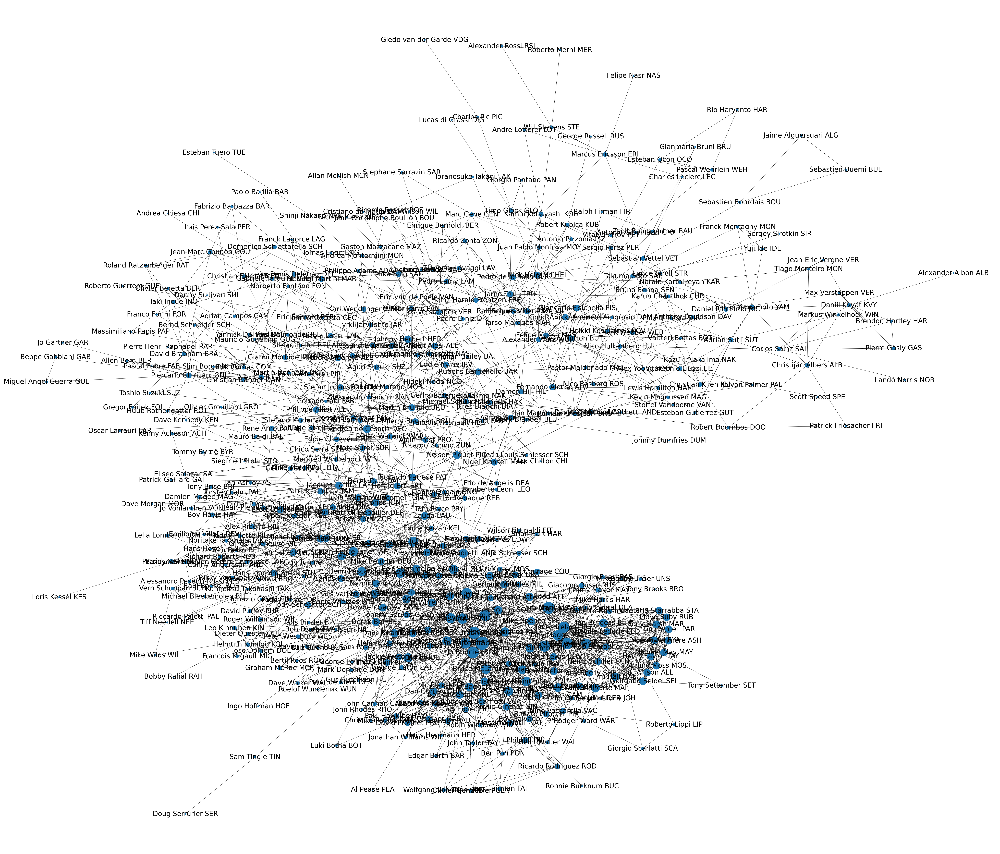

In [219]:
import networkx as nx
import matplotlib.pyplot as plt

Gf = nx.Graph()
Gf.add_edges_from(good_connection)
d = dict(Gf.degree)
plt.figure(figsize=(82, 70))
#plt.title('Kierowcy F1 którzy jeździli ze sobą w jednym zepole w sezonie [1961-2019]', loc='center',
       #   fontsize=32)
nx.draw_kamada_kawai(Gf, with_labels=True, font_size=40, node_size=[v * 100 for v in d.values()])
plt.show()

(bez testowań) cel badawczy -> eksperyment -> plan eksperymentu -> zestaw inf. który trzeba dać innym osobom żeby mogły powótrzyć (zmienne) -> wyniki badań/uruchomień -> spostrzeżenia, wnioski, (uwagi)

problem (1-2 zdania, badanie sieci połączen) sformułowanie zadania (dane są ..., szukana ścieżka...) rozwiązanie (planuje rozwiązać problem przez ...) środki tech. (biblioteki) plan eksp (uruchamianie programu co x, ponieważ ... aby ...) wyniki badań, spotrzeżenia, wnioski (Razem) ->

bez bibliografi

dynamika sieci 
czy nowe węzly maja tendencje do łączenia sie ze starymi
korelacje?
spójność grafu

In [217]:
print(Gf.number_of_nodes())
print(Gf.number_of_edges())
print(nx.info(Gf))
#nx.degree_assortativity_coefficient(Gf, weight=None, nodes=None)
#nx.average_shortest_path_length(Gf)
print(nx.number_connected_components(Gf))
good_connection2 = (list(nx.connected_components(Gf)))
print(good_connection2[1])

465
2220
Name: 
Type: Graph
Number of nodes: 465
Number of edges: 2220
Average degree:   9.5484
2
{'Jules Bianchi BIA', 'Max Chilton CHI'}


In [122]:
Gf.remove_node('Jules Bianchi BIA')
Gf.remove_node('Max Chilton CHI')

In [124]:
nx.average_shortest_path_length(Gf)

4.12634521705796

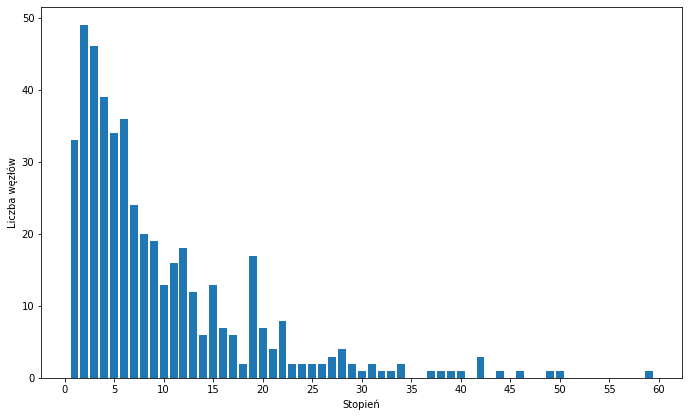

In [218]:
import numpy as np

degree_sequence = sorted((d for n, d in Gf.degree()))
fig = plt.figure("Degree of a random graph", figsize=(24, 18))
ax = fig.add_subplot(axgrid[3:, 2:])
ax.bar(*np.unique(degree_sequence, return_counts=True))
#ax.set_title("Rozkład stopni węzłów")
ax.set_xlabel("Stopień")
ax.set_ylabel("Liczba węzłów")
plt.xticks([*range(0, 65, 5)])
plt.show()

In [216]:
print(Gf.number_of_nodes())
print(Gf.number_of_edges())
print(nx.shortest_path_length(Gf, source='Charles Leclerc LEC', target='Wolfgang von Trips VON'))
print(nx.shortest_path(Gf, source='Charles Leclerc LEC', target='Wolfgang von Trips VON'))

def shortest_drivers_path(graph, driver1, driver2):
    teammates = (nx.shortest_path(graph, source=driver1, target=driver2))
    number_of_teamates_b = ((len(nx.shortest_path(graph, source=driver1, target=driver2)))-2)
    print(f"\nThere is {number_of_teamates_b} drivers between '{driver1}' and '{driver2}':")
    print(teammates[1:-1])
              
shortest_drivers_path(Gf, 'Jim Clark CLA', 'Max Verstappen VER')

465
2220
8
['Charles Leclerc LEC', 'Sebastian Vettel VET', 'Kimi RĂ¤ikkĂ¶nen RAI', 'Fernando Alonso ALO', 'Nelson Piquet PIQ', 'Jacky Ickx ICK', 'Chris Amon AMO', 'Richie Ginther GIN', 'Wolfgang von Trips VON']

There is 5 drivers between 'Jim Clark CLA' and 'Max Verstappen VER':
['Mario Andretti AND', 'Nigel Mansell MAN', 'David Coulthard COU', 'Vitantonio Liuzzi LIU', 'Daniel Ricciardo RIC']


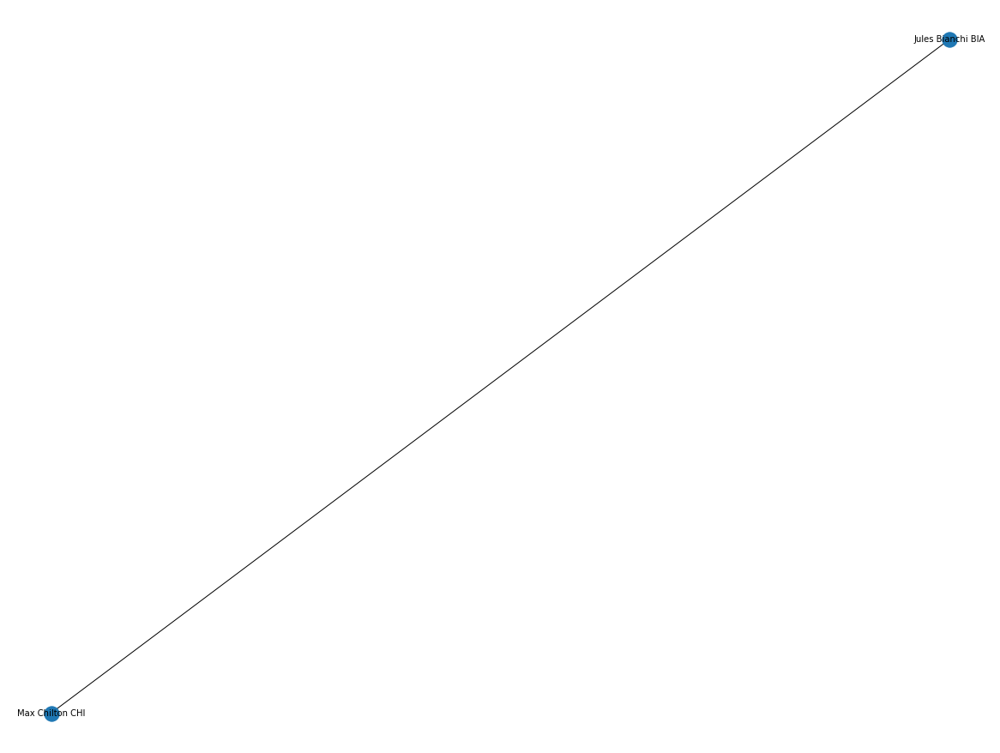

In [210]:
Gf2 = nx.Graph()
Gf2.add_edge(('Jules Bianchi BIA'), ('Max Chilton CHI'))
plt.figure(figsize=(16, 12))
nx.draw_kamada_kawai(Gf2, with_labels=True, font_size=10)
plt.show()